# Analysis of the Colors Used in Nausicaa of the Valley of the Wind

## Project Goals

This project aims to extract and analyze the most common colors from each frame of the Studio Ghibli film "Nausicaa of the Valley of the Wind." The primary objectives are:

1. **Extract Dominant Colors:** Utilize a script to extract the 10 most common hexcodes from each frame of the film. This is done in the ExtractColors.py Script.

2. **Store Data Efficiently:** Save the extracted color data into a CSV file for easy access and analysis. This is done in the ExtractColors.py Script.

3. **Analyze Color Usage:** Perform various analyses to understand the color distribution and flow throughout the film. This includes:

    * Identifying the most commonly used colors across the entire film.
    * Analyzing color usage in different sections of the film.
    * Visualizing the dominant color by frame to observe the color flow.
    * Using K-means to determine the the dominant clusters of colors used.

4. **Create Themed Outfits:** Use the color data to design outfits inspired by the film's color palette.

The ultimate goal is to blend data science with creative design, providing insights into the film's visual style and inspiring new fashion ideas based on the analyzed color patterns.


In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import HTML
import re
import plotly.graph_objs as go
import colorsys


* Dropping the 10th color as it seems to have not been picked up in the earlier script.

In [2]:
file_path = '/Users/rsudhir/Documents/GitHub/Data-Science-Project---Outfits-from-Ghibli-Films/NausicaaOfTheValleyOfTheWind/Nausicaa_dominant_colors.csv'

df = pd.read_csv(file_path)

# Drop the columns for the 10th color
df = df.drop(columns=['color_10_r', 'color_10_g', 'color_10_b'])


* Adding a more intuitive name to each frame, will update script at a later point to reflect this change.

In [3]:

def extract_frame_number(frame_path):
    match = re.search(r'output_(\d+)\.png', frame_path)
    if match:
        return int(match.group(1))
    return None

# Add frame number column and sort by frame number
df['frame_number'] = df['frame_path'].apply(extract_frame_number)
df = df.sort_values(by='frame_number').reset_index(drop=True)

df = df.drop(['frame_path'],axis=1)

# Display the first few rows of the sorted DataFrame
df.head()

,color_1_r,color_1_g,color_1_b,color_2_r,color_2_g,color_2_b,color_3_r,color_3_g,color_3_b,color_4_r,...,color_7_r,color_7_g,color_7_b,color_8_r,color_8_g,color_8_b,color_9_r,color_9_g,color_9_b,frame_number
0,96,98,69,125,115,78,48,42,27,57,...,80,67,27,20,19,12,115,124,93,1
1,131,126,98,84,84,67,47,47,36,149,...,155,156,128,100,83,60,68,52,36,2
2,128,124,96,77,79,62,92,79,42,92,...,151,152,142,61,51,34,155,156,129,3
3,131,126,98,84,84,66,45,45,33,164,...,100,83,59,155,156,128,68,52,35,4
4,131,125,98,84,84,67,45,45,33,151,...,100,84,60,155,156,129,68,52,35,5


## Color Trends Over Time:
* To start lets look at color trends over time. First lets look into the modal colors appearing over the length of the film. 


In [4]:
# Function to combine RGB columns into a tuple
def combine_rgb(row, color_idx):
    try:
        return (int(row[f'color_{color_idx}_r']), int(row[f'color_{color_idx}_g']), int(row[f'color_{color_idx}_b']))
    except ValueError:
        return None

# Function to analyze and plot color data for a segment
def analyze_segment(segment_df, title):
    # Extract all color tuples
    all_colors = []
    num_colors = 9  # Updated number of colors per frame since we dropped the 10th color
    for idx in range(1, num_colors + 1):
        all_colors.extend(segment_df.apply(combine_rgb, color_idx=idx, axis=1))

    # Filter out None values
    all_colors = [color for color in all_colors if color is not None]

    # Count occurrences of each color
    color_counts = Counter(all_colors)


    # Convert to DataFrame for easier plotting
    color_df = pd.DataFrame(color_counts.items(), columns=['color', 'count'])

    # Convert RGB tuples to hex color codes for better visualization
    def rgb_to_hex(rgb):
        return '#{:02x}{:02x}{:02x}'.format(rgb[0], rgb[1], rgb[2])

    color_df['color_hex'] = color_df['color'].apply(rgb_to_hex)
    color_df = color_df.sort_values(by='count', ascending=False)

    # Add the color square column
    def color_square(hex_code):
        return f'<div style="width: 20px; height: 20px; background-color: {hex_code};"></div>'

    color_df['color_display'] = color_df['color_hex'].apply(color_square)

    # Display only the top 10 rows
    top_10_colors = color_df.head(10)
    display(HTML(top_10_colors.to_html(escape=False)))

    # Plot the top 10 most common colors
    plt.figure(figsize=(12, 8))
    palette = {hex_code: hex_code for hex_code in top_10_colors['color_hex']}
    sns.barplot(x='color_hex', y='count', hue='color_hex', data=top_10_colors, palette=palette, dodge=False, legend=False)
    plt.xlabel('Color')
    plt.ylabel('Count')
    plt.title(f'Top 10 Most Common Colors in {title}')
    plt.xticks(rotation=45)
    plt.show()

# Function to segment the DataFrame and analyze each segment

def segment_and_analyze(df, num_segments=3):
    # Calculate the total number of frames
    total_frames = df['frame_number'].max()
    
    # Determine the size of each segment
    segment_size = total_frames // num_segments

    segments = []
    for i in range(num_segments):
        # Calculate the start and end frame numbers for the current segment
        start_frame = i * segment_size
        end_frame = (i + 1) * segment_size if i < num_segments - 1 else total_frames

        # Filter the DataFrame to include only frames within the current segment
        segments.append(df[(df['frame_number'] > start_frame) & (df['frame_number'] <= end_frame)])

    # Analyze each segment
    for i, segment_df in enumerate(segments):
        analyze_segment(segment_df, f'Segment {i+1}')



### Dominant Colors Over The Whole Film

,color,count,color_hex,color_display
12898,"(12, 16, 8)",62,#0c1008,
6804,"(4, 4, 4)",45,#040404,
134,"(12, 12, 12)",43,#0c0c0c,
23456,"(20, 28, 20)",41,#141c14,
36248,"(16, 14, 13)",35,#100e0d,
3412,"(57, 105, 120)",32,#396978,
12897,"(12, 20, 12)",31,#0c140c,
29678,"(16, 14, 12)",28,#100e0c,
1894,"(20, 17, 15)",27,#14110f,
10628,"(34, 36, 32)",25,#222420,


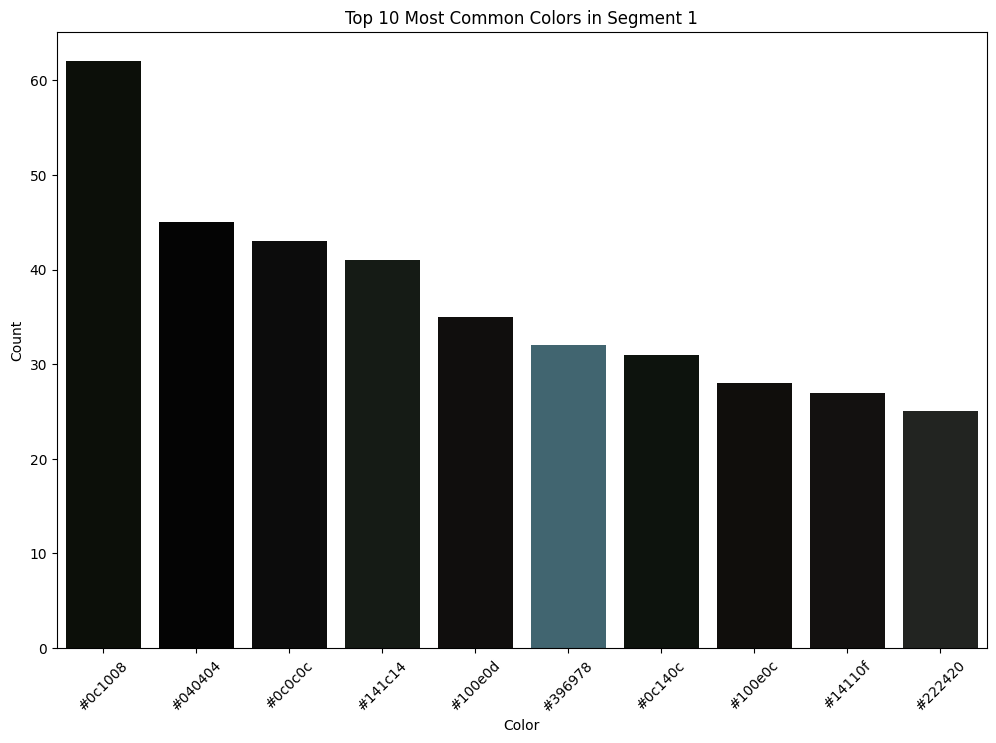

In [5]:

# Perform the segmentation and analysis for 1 segment, ie the whole movie
segment_and_analyze(df, 1)

## Scene Segmentation:
* Next lets split the film into segments and look at the color palettes. This can help in understanding the color composition of specific segments of the film. This can reveal patterns or themes in the film's visual storytelling.

### Dominant Colors Over The Film Split Into 3 Segments

,color,count,color_hex,color_display
4684,"(12, 16, 8)",51,#0c1008,
134,"(12, 12, 12)",20,#0c0c0c,
9762,"(20, 43, 61)",17,#142b3d,
2500,"(4, 4, 4)",15,#040404,
2403,"(20, 20, 16)",15,#141410,
9227,"(79, 37, 19)",15,#4f2513,
3702,"(36, 118, 144)",14,#247690,
9372,"(33, 60, 51)",14,#213c33,
5305,"(89, 126, 141)",14,#597e8d,
4727,"(31, 18, 13)",14,#1f120d,


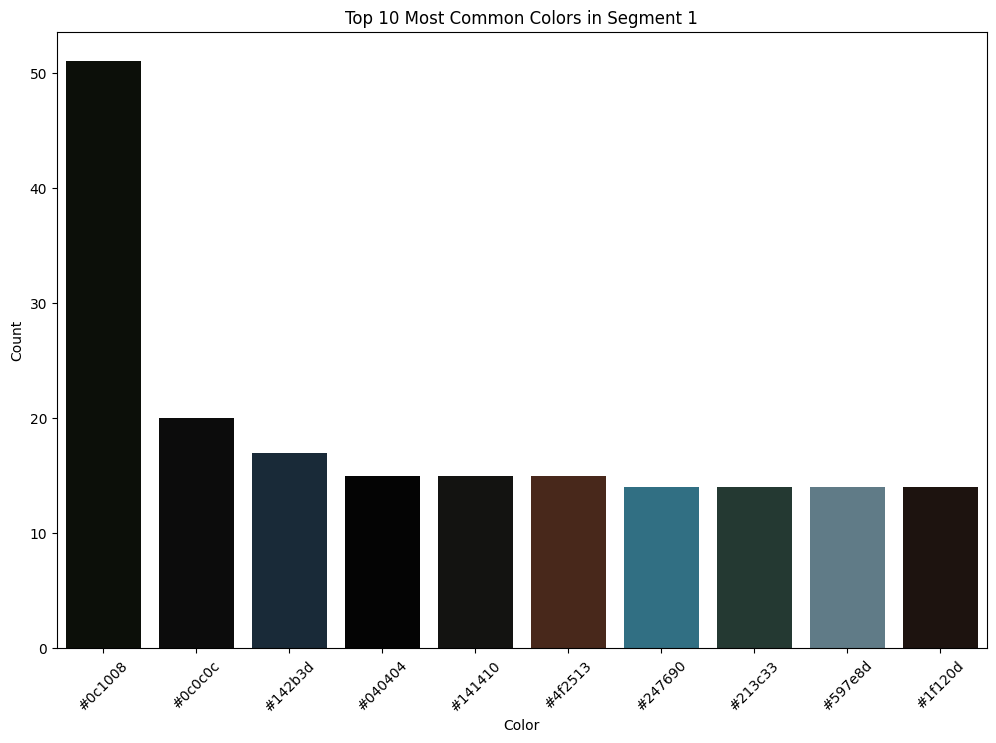

,color,count,color_hex,color_display
12518,"(16, 14, 13)",32,#100e0d,
1116,"(57, 105, 120)",32,#396978,
2144,"(20, 17, 15)",25,#14110f,
5124,"(136, 159, 170)",24,#889faa,
12508,"(92, 89, 74)",23,#5c594a,
1119,"(223, 200, 196)",23,#dfc8c4,
7790,"(167, 162, 150)",22,#a7a296,
6382,"(4, 4, 4)",21,#040404,
8159,"(65, 83, 90)",21,#41535a,
2207,"(42, 30, 23)",21,#2a1e17,


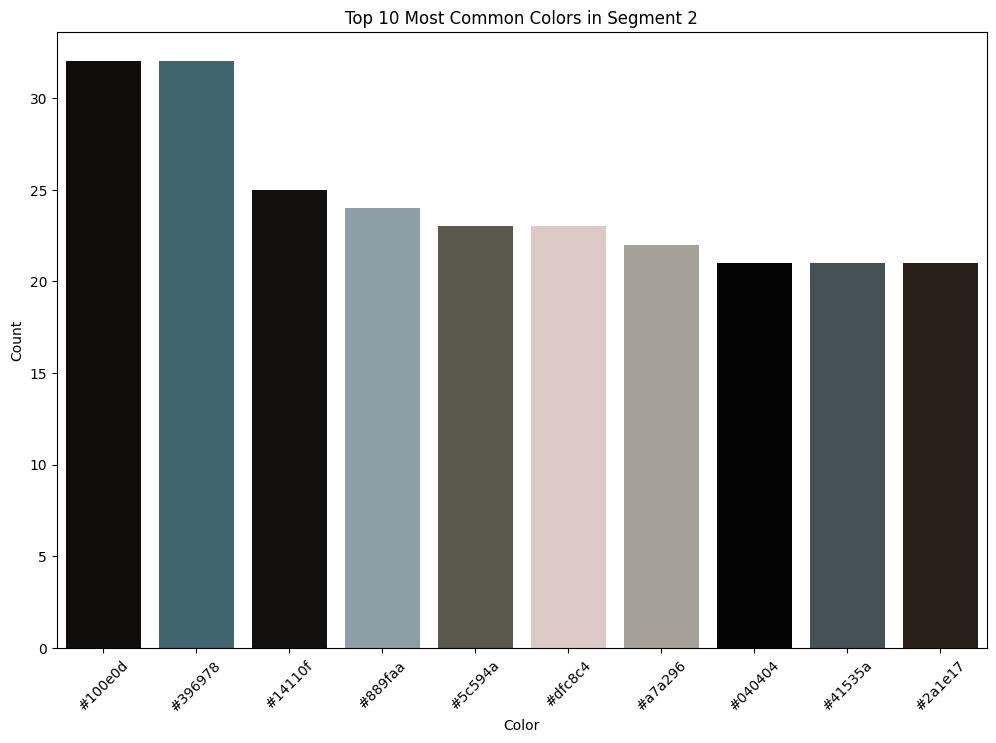

,color,count,color_hex,color_display
6841,"(20, 28, 20)",30,#141c14,
2764,"(34, 32, 24)",23,#222018,
4907,"(22, 20, 14)",21,#16140e,
289,"(14, 13, 12)",21,#0e0d0c,
2328,"(27, 27, 23)",21,#1b1b17,
82,"(188, 157, 135)",20,#bc9d87,
8525,"(36, 24, 15)",19,#24180f,
904,"(32, 38, 44)",19,#20262c,
497,"(43, 41, 31)",19,#2b291f,
2648,"(36, 33, 22)",18,#242116,


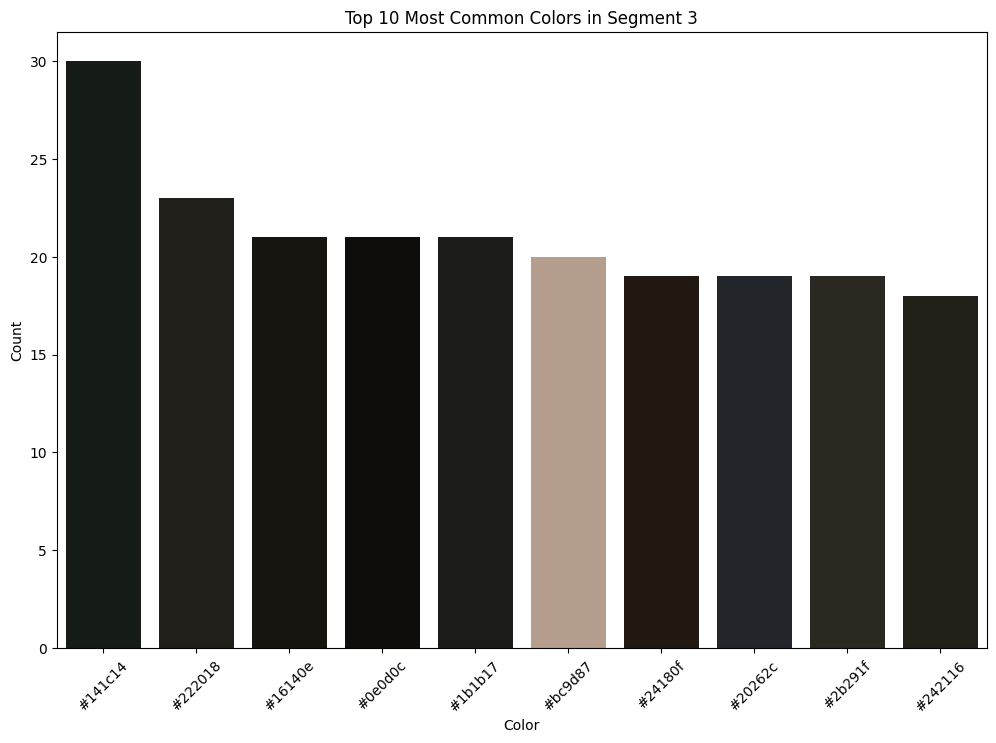

In [6]:
segment_and_analyze(df, 3)

### Dominant Colors Over The Film Split Into 5 Segments

,color,count,color_hex,color_display
2984,"(12, 16, 8)",51,#0c1008,
134,"(12, 12, 12)",20,#0c0c0c,
6329,"(20, 43, 61)",17,#142b3d,
5791,"(79, 37, 19)",15,#4f2513,
1620,"(4, 4, 4)",15,#040404,
1522,"(20, 20, 16)",15,#141410,
3027,"(31, 18, 13)",14,#1f120d,
5938,"(33, 60, 51)",14,#213c33,
3605,"(89, 126, 141)",14,#597e8d,
3560,"(19, 26, 30)",13,#131a1e,


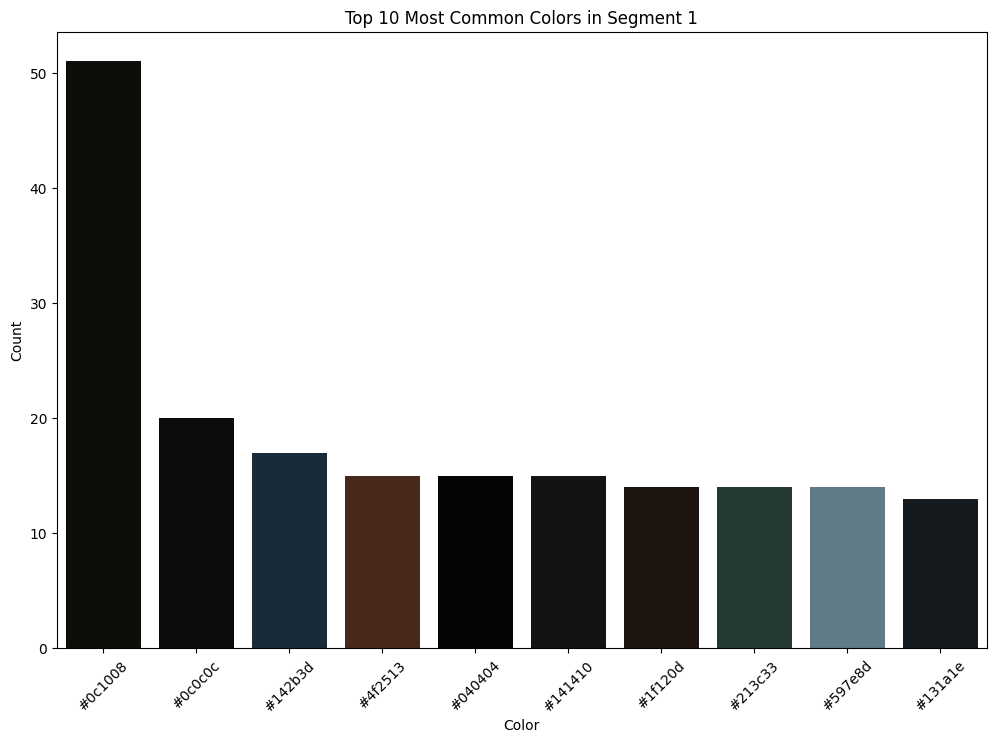

,color,count,color_hex,color_display
469,"(20, 17, 15)",23,#14110f,
5752,"(94, 50, 26)",20,#5e321a,
2142,"(42, 30, 23)",20,#2a1e17,
4574,"(21, 14, 12)",18,#150e0c,
4506,"(55, 37, 23)",16,#372517,
710,"(25, 22, 18)",15,#191612,
901,"(186, 130, 93)",15,#ba825d,
3294,"(139, 159, 161)",14,#8b9fa1,
3493,"(35, 36, 35)",14,#232423,
5717,"(18, 15, 12)",14,#120f0c,


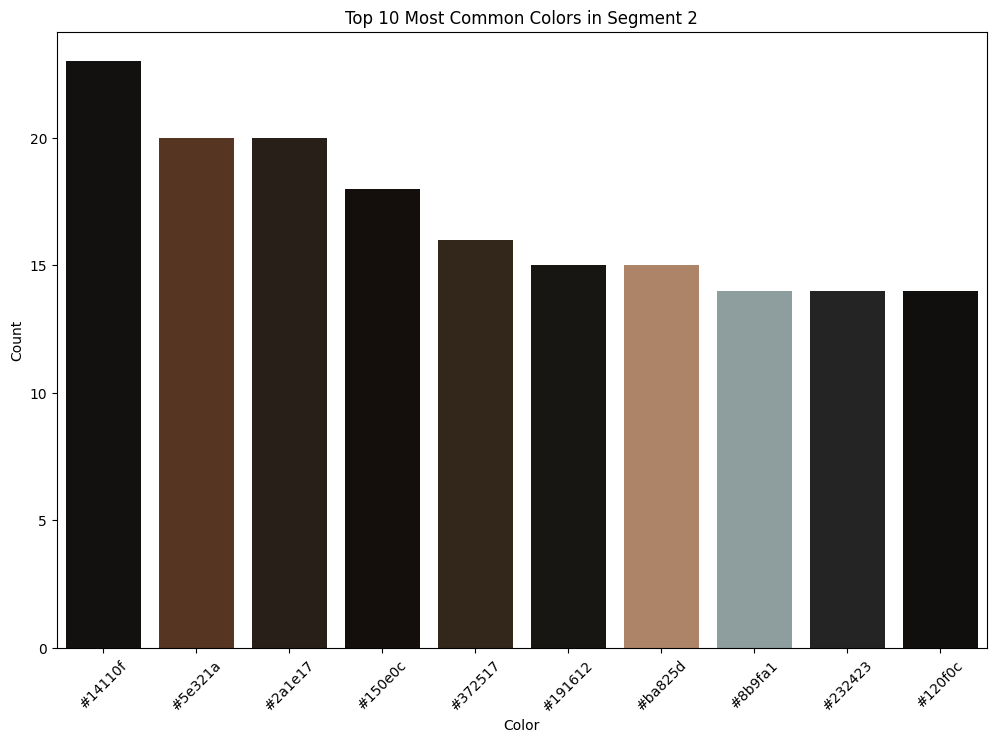

,color,count,color_hex,color_display
766,"(57, 105, 120)",32,#396978,
3381,"(136, 159, 170)",24,#889faa,
769,"(223, 200, 196)",23,#dfc8c4,
7605,"(101, 143, 159)",19,#658f9f,
6178,"(99, 137, 153)",18,#638999,
770,"(223, 199, 195)",18,#dfc7c3,
1825,"(33, 24, 22)",17,#211816,
3014,"(18, 18, 23)",17,#121217,
4926,"(150, 151, 147)",16,#969793,
2241,"(41, 27, 22)",16,#291b16,


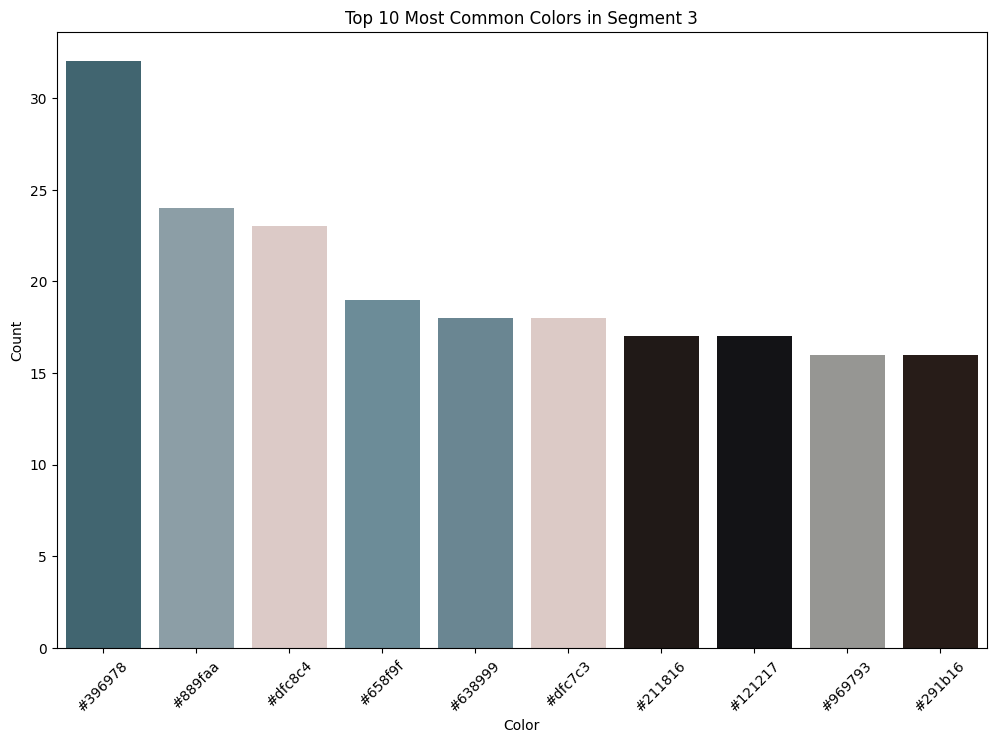

,color,count,color_hex,color_display
6056,"(16, 14, 13)",35,#100e0d,
4100,"(20, 28, 20)",30,#141c14,
4953,"(16, 14, 12)",28,#100e0c,
1536,"(34, 36, 32)",23,#222420,
2045,"(34, 32, 24)",23,#222018,
6046,"(92, 89, 74)",23,#5c594a,
3385,"(167, 162, 150)",21,#a7a296,
680,"(14, 13, 12)",21,#0e0d0c,
1609,"(27, 27, 23)",21,#1b1b17,
3754,"(65, 83, 90)",21,#41535a,


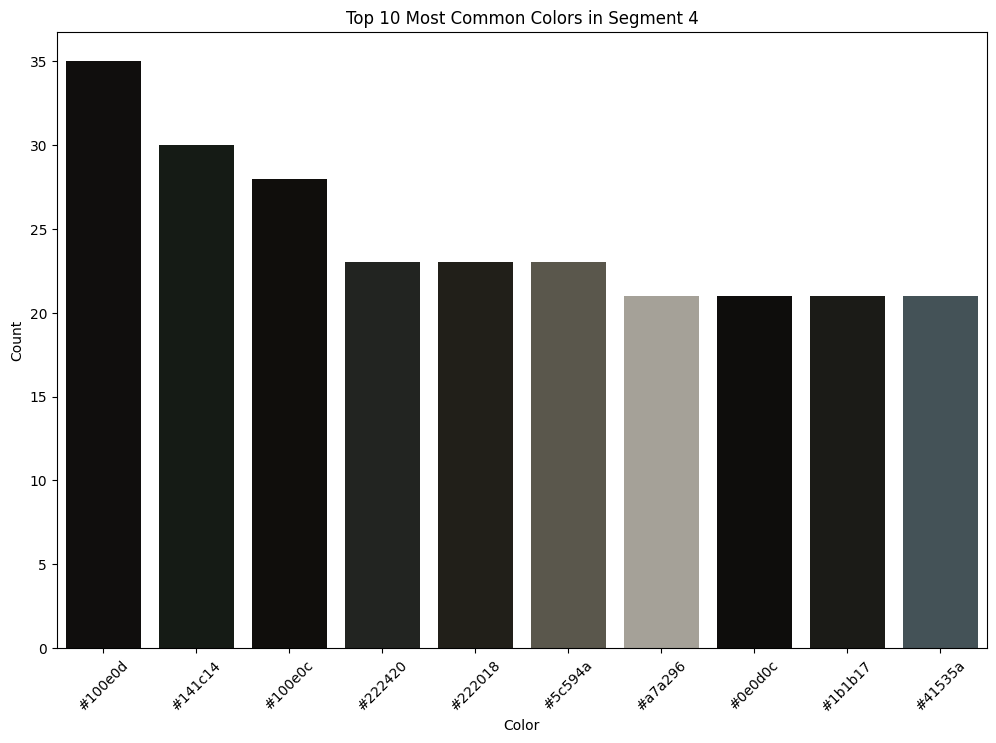

,color,count,color_hex,color_display
122,"(32, 38, 44)",19,#20262c,
5468,"(36, 24, 15)",19,#24180f,
11374,"(54, 73, 63)",16,#36493f,
5753,"(97, 120, 118)",16,#617876,
1539,"(23, 21, 22)",16,#171516,
1192,"(83, 118, 112)",15,#537670,
8474,"(135, 161, 166)",14,#87a1a6,
8735,"(103, 147, 156)",14,#67939c,
10165,"(107, 156, 161)",13,#6b9ca1,
1106,"(39, 53, 52)",13,#273534,


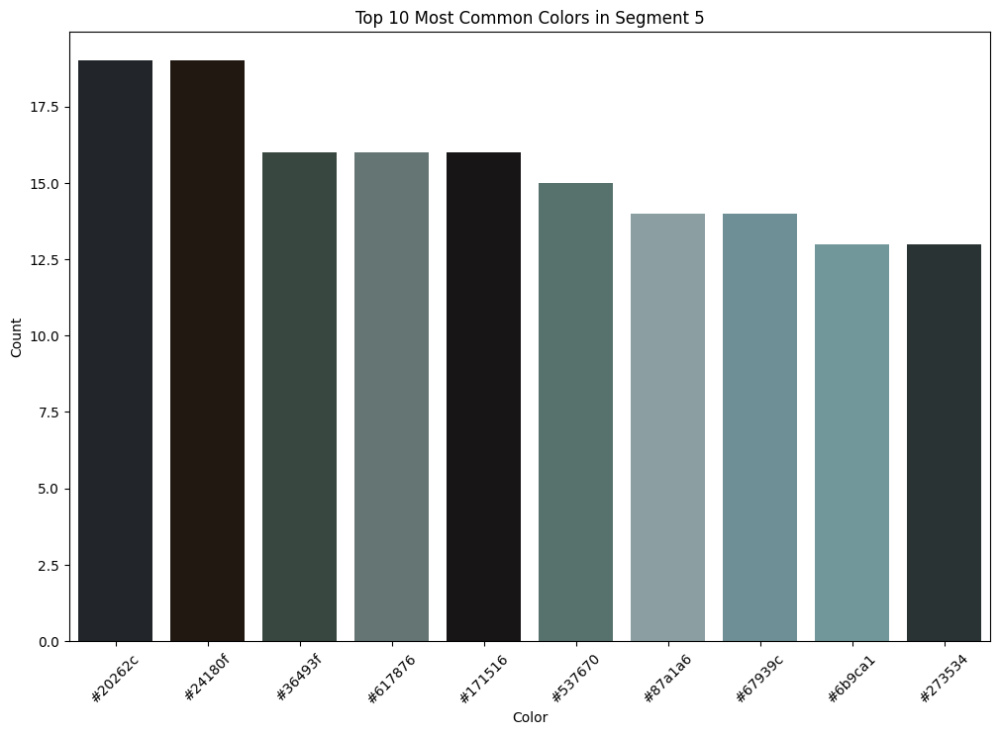

In [7]:
segment_and_analyze(df, 5)

## Dominant Color by Frame:

* For each frame, lets identify the single most dominant color and plot its occurrence over time. This can give a simplified view of the color flow in the film.

In [8]:
# Extract the most dominant color (first color) for each frame
df['dominant_color'] = df.apply(lambda row: combine_rgb(row, 1), axis=1)

# Convert RGB tuples to hex color codes for better visualization
def rgb_to_hex(rgb):
    if rgb is not None:
        return '#{:02x}{:02x}{:02x}'.format(rgb[0], rgb[1], rgb[2])
    return None

df['dominant_color_hex'] = df['dominant_color'].apply(rgb_to_hex)

# Display the first few rows to verify
df[['frame_number', 'dominant_color', 'dominant_color_hex']].head()

,frame_number,dominant_color,dominant_color_hex
0,1,"(96, 98, 69)",#606245
1,2,"(131, 126, 98)",#837e62
2,3,"(128, 124, 96)",#807c60
3,4,"(131, 126, 98)",#837e62
4,5,"(131, 125, 98)",#837d62


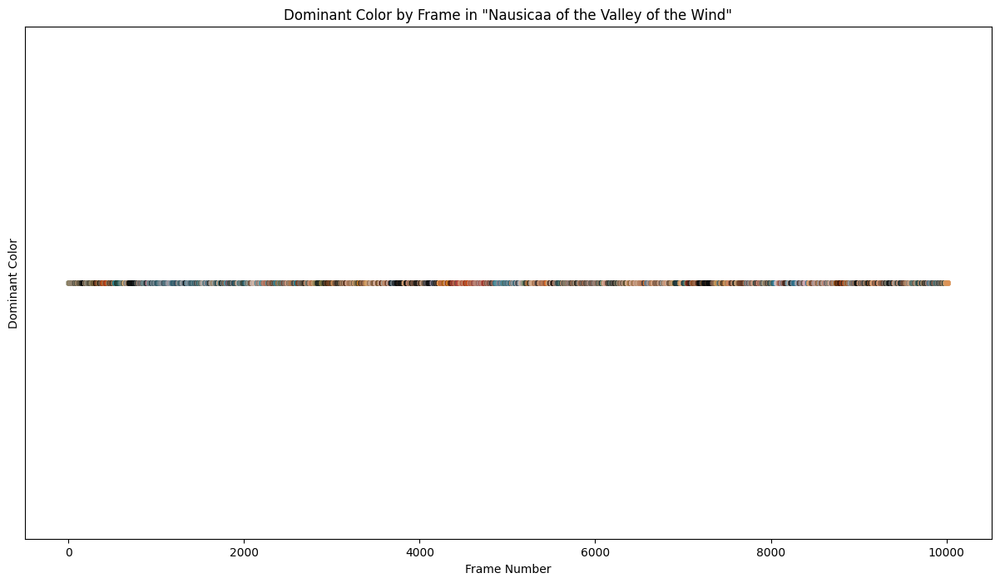

In [9]:

# Create a time series plot of the dominant color
plt.figure(figsize=(15, 8))
plt.scatter(df['frame_number'], [1] * len(df), c=df['dominant_color_hex'], s=10, marker='s')

plt.xlabel('Frame Number')
plt.ylabel('Dominant Color')
plt.title('Dominant Color by Frame in "Nausicaa of the Valley of the Wind"')
plt.yticks([])
plt.show()


quite uninterpretable, lets try something different.

**Heatmap**: This approach creates a heatmap-like visualization where the x-axis represents frame numbers and the colors represent the dominant colors. The y-axis is not used for any specific value but is used to show the color as a bar.

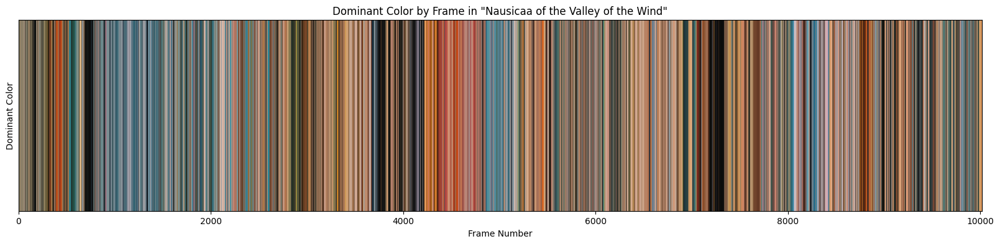

In [10]:

# Create a 2D array with frame numbers and dominant colors
frame_numbers = df['frame_number'].values
dominant_colors_rgb = np.array(df['dominant_color'].tolist())

# Create the heatmap
plt.figure(figsize=(20, 4))
plt.imshow([dominant_colors_rgb], aspect='auto', extent=[0, len(frame_numbers), 0, 1])
plt.xlabel('Frame Number')
plt.ylabel('Dominant Color')
plt.title('Dominant Color by Frame in "Nausicaa of the Valley of the Wind"')
plt.yticks([])
plt.show()



**Plotting in Segments**: By dividing the data into smaller segments, we can create multiple plots that show the dominant colors for a range of frames. This can help in observing patterns and changes more clearly.

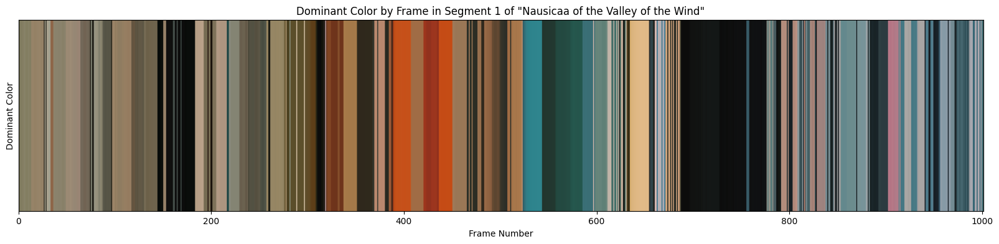

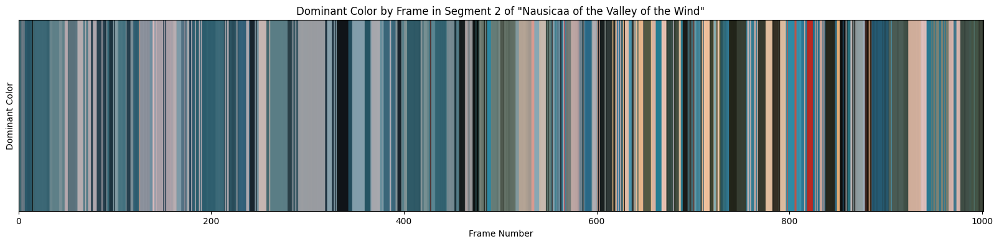

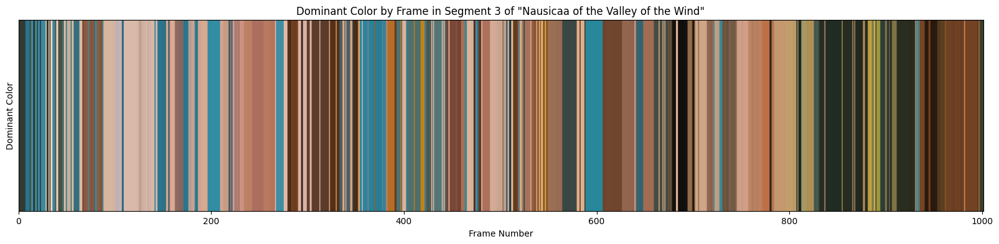

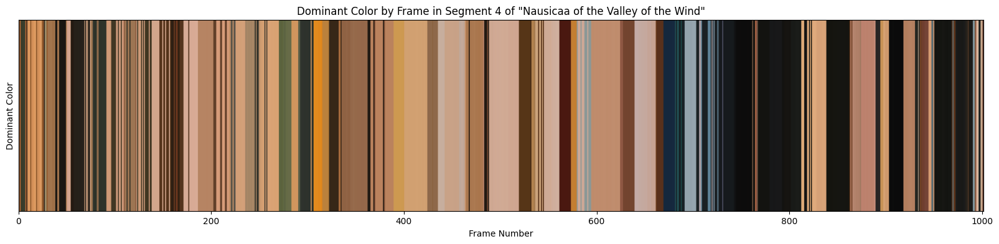

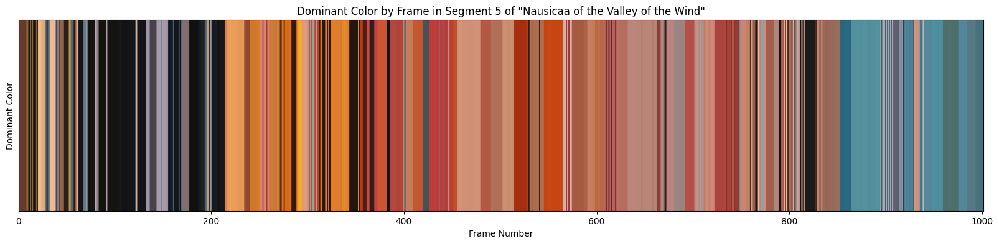

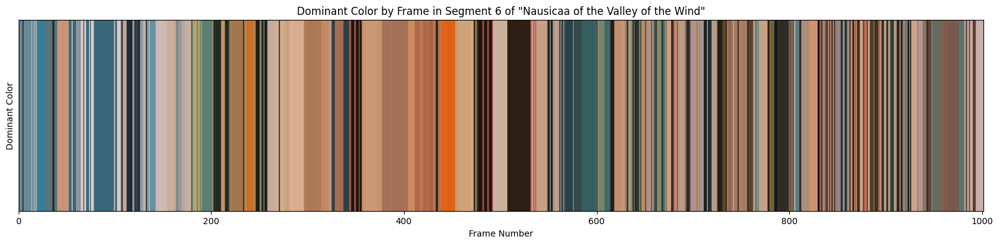

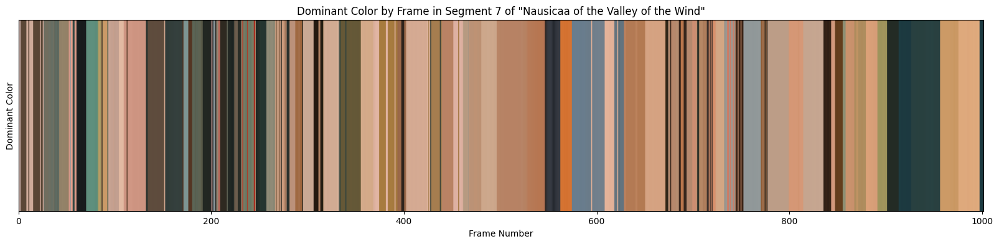

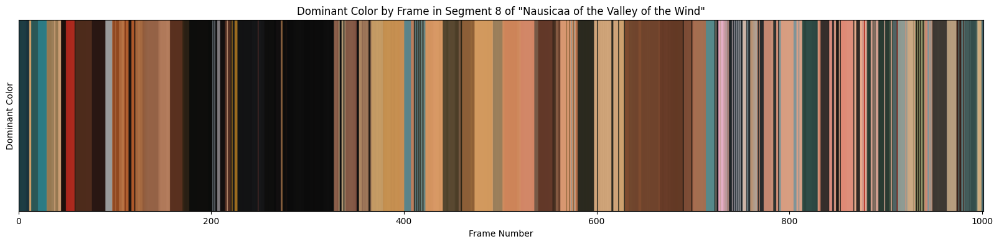

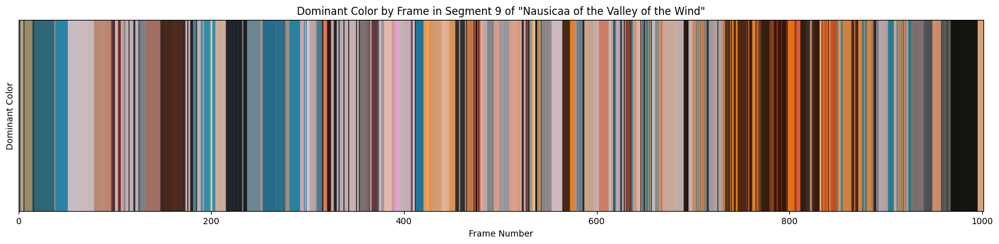

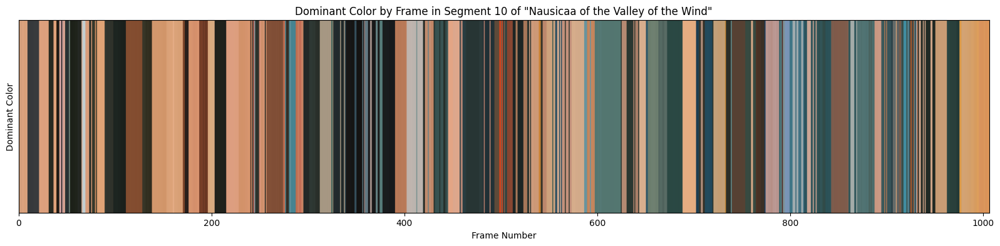

In [11]:

def plot_segments(df, num_segments=5):
    segment_size = len(df) // num_segments

    for i in range(num_segments):
        start = i * segment_size
        end = (i + 1) * segment_size if i < num_segments - 1 else len(df)

        segment = df.iloc[start:end]
        frame_numbers = segment['frame_number'].values
        dominant_colors_rgb = np.array(segment['dominant_color'].tolist())

        # Create the heatmap
        plt.figure(figsize=(20, 4))
        plt.imshow([dominant_colors_rgb], aspect='auto', extent=[0, len(frame_numbers), 0, 1])
        plt.xlabel('Frame Number')
        plt.ylabel('Dominant Color')
        plt.title(f'Dominant Color by Frame in Segment {i+1} of "Nausicaa of the Valley of the Wind"')
        plt.yticks([])
        plt.show()

plot_segments(df, num_segments=10)


## Color Clustering:

* Use clustering algorithms to group similar colors and analyze these clusters to understand dominant color groups.

### Applying K-Means to Color Clustering
In this context, we are clustering RGB colors extracted from the frames of "Howl's Moving Castle". Here's how the process applies to our task:

* Prepare the Data:

    - Extract all the RGB colors from the frames and store them in a DataFrame.
    - Each color is represented as a tuple of three values: (R, G, B).

* Initialize and Fit the K-Means Model:

    - We specify the number of clusters, k, which is the number of dominant color groups we want to identify. In this case, we chose k=10.
    - The K-Means model is initialized and fitted to the RGB color data.

* Cluster Assignment:

    - Each color (data point) is assigned to the nearest cluster centroid.
    - This assignment groups similar colors together.

* Determine Cluster Centers:

    - The centroids (cluster centers) are calculated as the mean of the colors in each cluster.
    - These centroids represent the dominant colors of the clusters.

* Visualization:

    - We count the number of colors in each cluster to understand their prevalence.
    - The cluster centers are converted to hex color codes and plotted to visualize the dominant colors.

### Elbow Method to Determine Number of Clusters

### Specifically Inertia

**Inertia** in the context of K-Means clustering is a measure of how internally coherent the clusters are. Specifically, it is the sum of squared distances from each point to its assigned cluster center. Lower inertia means the points are closer to their cluster centers, indicating better-defined clusters.

**Key Points about Inertia:**

* Inertia is not bounded between 0 and 1. It depends on the data and can take any positive value.
* Lower inertia values indicate that points are closer to their cluster centers, which generally suggests better clustering.
* As the number of clusters increases, inertia decreases because adding more clusters reduces the distance between points and their closest cluster center.

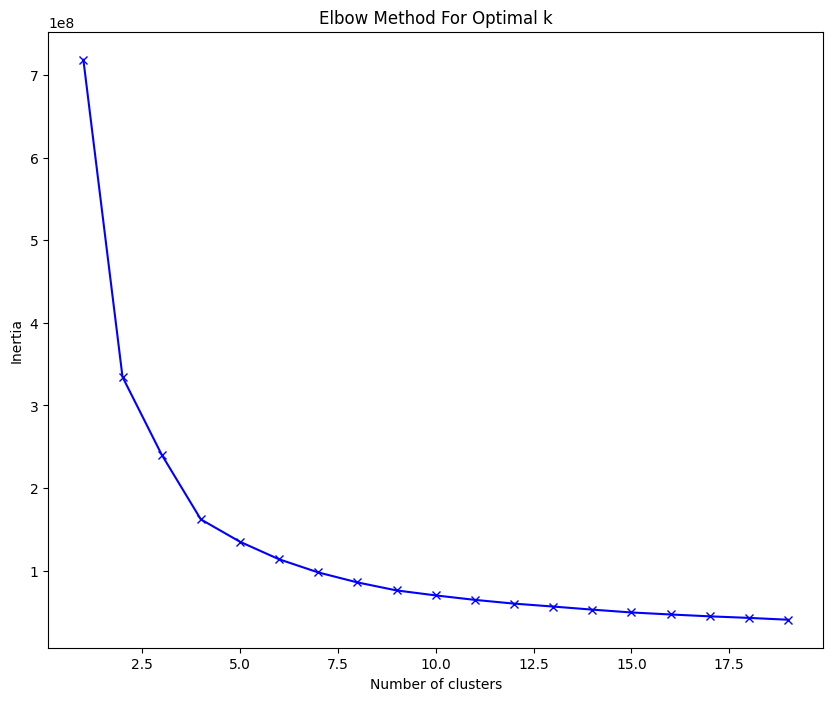

In [12]:
# Extract all color tuples from each frame
all_colors = []
num_colors = 9  # Updated number of colors per frame since we dropped the 10th color
for idx in range(1, num_colors + 1):
    all_colors.extend(df.apply(combine_rgb, color_idx=idx, axis=1))

# Filter out None values
all_colors = [color for color in all_colors if color is not None]

# Convert to DataFrame for easier manipulation
color_df = pd.DataFrame(all_colors, columns=['r', 'g', 'b'])

# Calculate inertia for different numbers of clusters
inertia = []
K = range(1, 20)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10).fit(color_df)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Curve
plt.figure(figsize=(10, 8))
plt.plot(K, inertia, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k')
plt.show()

* While the elbow seems to sit around 3/4, I've noticed that the lower the number of clusters, the more muted the color of the each cluster. This probably has to do with it averaging more muted tones due to the reduced number of clusters, for example look at the plot with 5 clusters compared to 10 and 15 clusters.

In [13]:

def k_means_func(k_clusters):
    # Apply K-Means clustering
    num_clusters = k_clusters  # You can change this to the number of clusters you want
    kmeans = KMeans(n_clusters=num_clusters, random_state=0, n_init=10).fit(color_df)
    color_df['cluster'] = kmeans.labels_

    # Get the cluster centers (dominant colors)
    cluster_centers = kmeans.cluster_centers_

    # Convert cluster centers to hex for visualization
    def rgb_to_hex(rgb):
        return '#{:02x}{:02x}{:02x}'.format(int(rgb[0]), int(rgb[1]), int(rgb[2]))

    cluster_colors = [rgb_to_hex(center) for center in cluster_centers]

    # Count the number of pixels in each cluster
    cluster_counts = color_df['cluster'].value_counts().sort_index()

    # Create a DataFrame for the cluster colors and counts
    cluster_df = pd.DataFrame({
        'color': cluster_colors,
        'count': cluster_counts
    })

    # Plot the color clusters
    plt.figure(figsize=(15, 8))
    sns.barplot(hue='color', y='count', data=cluster_df, palette=cluster_colors, legend=False)
    plt.xlabel('Cluster Color')
    plt.ylabel('Count')
    plt.title('Color Clustering in "Nausicaa of the Valley of the Wind"')
    plt.xticks(rotation=90)
    plt.show()

    return cluster_centers, cluster_colors


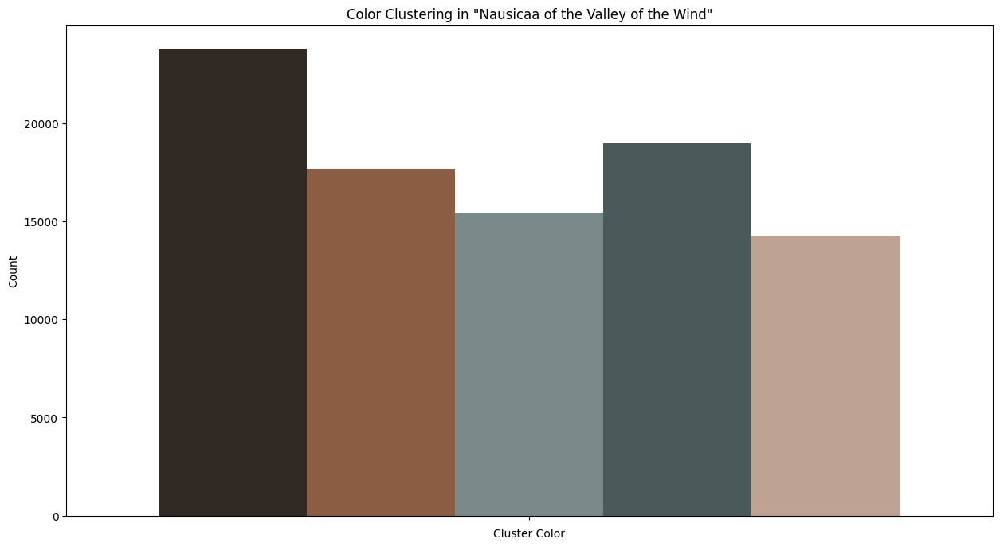

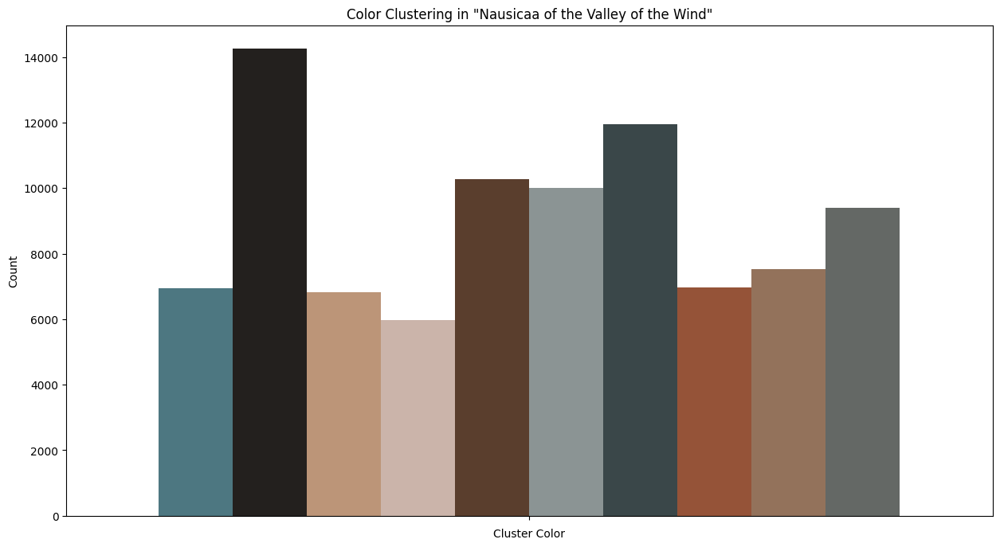

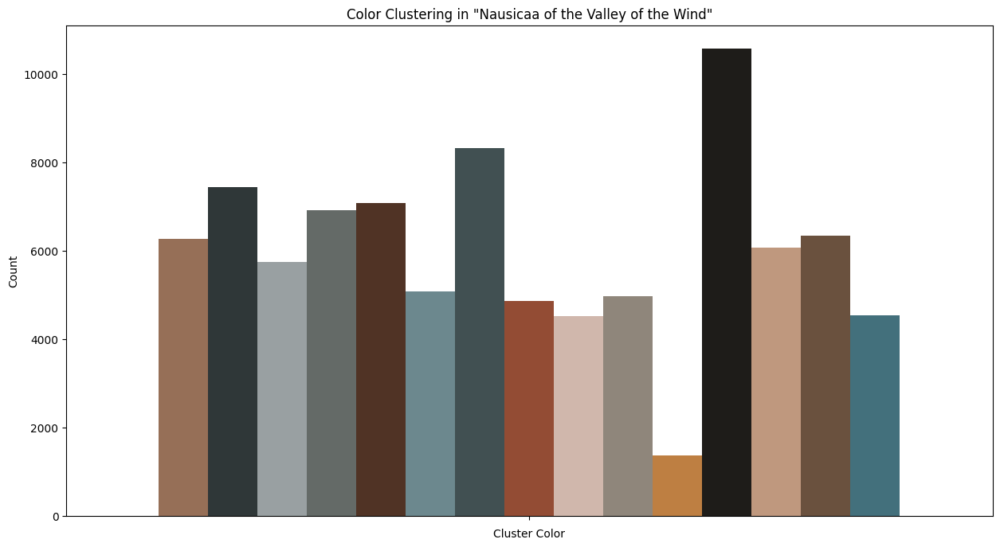

In [14]:
k_means_func(5)
k_means_func(10)
cluster_centers, cluster_colors = k_means_func(15)

As you can see as you increase the number of clusters, the intensity of the color increases. So for the goal of creating outfits I think slightly more vibrant colors would be more interestings.

### Plotting the clusters in 3D Space

Thankfully rgb is in 3d space so we can plot all the points in the data and aswell as the cluster centers to get a more intuitive view of where the clusters lie in regards to the data.

In [15]:
# Create 3D scatter plot
fig = go.Figure()

# Plot all colors
fig.add_trace(go.Scatter3d(
    x=color_df['r'],
    y=color_df['g'],
    z=color_df['b'],
    mode='markers',
    marker=dict(
        size=2,
        color=color_df.apply(lambda row: 'rgb({}, {}, {})'.format(row['r'], row['g'], row['b']), axis=1),
    ),
    name='Colors'
))

# Highlight cluster centers
for center, color in zip(cluster_centers, cluster_colors):
    fig.add_trace(go.Scatter3d(
        x=[center[0]],
        y=[center[1]],
        z=[center[2]],
        mode='markers',
        marker=dict(
            size=10,
            color=color,
            line=dict(width=2, color='black')
        ),
        name=f'Center {color}'
    ))

fig.update_layout(
    scene=dict(
        xaxis_title='Red',
        yaxis_title='Green',
        zaxis_title='Blue'
    ),
    title='Color Clustering in "Nausicaa of the Valley of the Wind"'
)

fig.show()

These plots are interactive, by clicking on them you can move them around. Clicking on the Colors icon on the right will remove all the colors and just show you the clusters.

### K-means of segments of the movie

Now lets segment the movie and perform k-means on those segments to see what the dominant colors are across different portions of the film.

In [16]:
# Function to plot K-Means clusters for segments
def plot_segments(color_df, num_segments=5, num_clusters=10):
    segment_size = len(color_df) // num_segments
    all_cluster_centers = []

    for i in range(num_segments):
        start = i * segment_size
        end = (i + 1) * segment_size if i < num_segments - 1 else len(color_df)

        segment = color_df.iloc[start:end]

        # Apply K-Means clustering to the segment
        kmeans = KMeans(n_clusters=num_clusters, random_state=0, n_init=10).fit(segment)
        segment.loc[:, 'cluster'] = kmeans.labels_

        # Get the cluster centers (dominant colors)
        cluster_centers = kmeans.cluster_centers_

        # Add the cluster centers to the list of all cluster centers
        all_cluster_centers.extend(cluster_centers)

        # Convert cluster centers to hex for visualization
        def rgb_to_hex(rgb):
            return '#{:02x}{:02x}{:02x}'.format(int(rgb[0]), int(rgb[1]), int(rgb[2]))

        cluster_colors = [rgb_to_hex(center) for center in cluster_centers]

        # Create 3D scatter plot for the segment
        fig = go.Figure()

        # Plot all colors in the segment
        fig.add_trace(go.Scatter3d(
            x=segment['r'],
            y=segment['g'],
            z=segment['b'],
            mode='markers',
            marker=dict(
                size=2,
                color=segment.apply(lambda row: 'rgb({}, {}, {})'.format(row['r'], row['g'], row['b']), axis=1),
            ),
            name='Colors'
        ))

        # Highlight cluster centers
        for center, color in zip(cluster_centers, cluster_colors):
            fig.add_trace(go.Scatter3d(
                x=[center[0]],
                y=[center[1]],
                z=[center[2]],
                mode='markers',
                marker=dict(
                    size=10,
                    color=color,
                    line=dict(width=2, color='black')
                ),
                name=f'Center {color}'
            ))

        fig.update_layout(
            scene=dict(
                xaxis_title='Red',
                yaxis_title='Green',
                zaxis_title='Blue'
            ),
            title=f'Color Clustering in Segment {i+1} of "Nausicaa of the Valley of the Wind"'
        )

        # Show the figure
        fig.show()
    
    return all_cluster_centers



In [17]:
# Perform K-Means clustering and plot segments
all_cluster_centers = plot_segments(color_df, num_segments=10, num_clusters=15)

### Finding the Most Common Cluster Centers

In [18]:
# Function to find the most common colors among cluster centers
def find_common_cluster_centers(cluster_centers, top_n=5):
    def rgb_to_hex(rgb):
        return '#{:02x}{:02x}{:02x}'.format(int(rgb[0]), int(rgb[1]), int(rgb[2]))

    # Count occurrences of each cluster center
    color_counts = Counter(tuple(center) for center in cluster_centers)
    top_colors = color_counts.most_common(top_n)
    
    print(f"Top {top_n} most common colors across all clusters:")
    for color, count in top_colors:
        print(f"Color: {rgb_to_hex(color)}, Count: {count}")

In [19]:
# Find and print the most common cluster centers
find_common_cluster_centers(all_cluster_centers, top_n=5)

Top 5 most common colors across all clusters:
Color: #314341, Count: 1
Color: #d0a285, Count: 1
Color: #368197, Count: 1
Color: #151412, Count: 1
Color: #cfb2a9, Count: 1


Seems that while the colors may look similar they have slight deviations in hue. Lets instead print out all the cluster centres ordered sequentially by hue, to get an idea of the general color of all the centers.

In [20]:
# Function to convert RGB to HSV for sorting by hue
def rgb_to_hsv(rgb):
    return colorsys.rgb_to_hsv(rgb[0]/255, rgb[1]/255, rgb[2]/255)

# Function to find the most common colors among cluster centers
def find_common_cluster_centers(cluster_centers):
    def rgb_to_hex(rgb):
        return '#{:02x}{:02x}{:02x}'.format(int(rgb[0]), int(rgb[1]), int(rgb[2]))

    # Convert cluster centers to hex and sort by hue
    cluster_centers_hsv = [(center, rgb_to_hsv(center)) for center in cluster_centers]
    cluster_centers_sorted = sorted(cluster_centers_hsv, key=lambda x: x[1])

    # Convert sorted centers back to RGB for printing
    cluster_centers_sorted_rgb = [center for center, hsv in cluster_centers_sorted]

    # Count occurrences of each cluster center
    color_counts = Counter(tuple(center) for center in cluster_centers_sorted_rgb)
    
    # Create HTML table with color boxes
    html_table = '<table>'
    for color, count in color_counts.items():
        hex_color = rgb_to_hex(color)
        html_table += f'<tr><td style="background-color:{hex_color}; width:50px;"></td><td>{hex_color}</td><td>Count: {count}</td></tr>'
    html_table += '</table>'
    
    display(HTML(html_table))

In [21]:
# Find and print the all the cluster centers (sorted) with color boxes
find_common_cluster_centers(all_cluster_centers)

,#ab351c,Count: 1
,#b14529,Count: 1
,#ac5139,Count: 1
,#baaaa5,Count: 1
,#cfb2a9,Count: 1
,#b54623,Count: 1
,#853b24,Count: 1
,#aa4520,Count: 1
,#ccb2a8,Count: 1
,#492416,Count: 1
,#dcb5a6,Count: 1


May be a bit redundant but lets try averaging these hues using k means to get a single representative color for each general color. I've also added a brightness filter to reduce overly dark colors from greatly impacting the k-means cluster centers.

In [22]:
# Function to convert HSV to RGB
def hsv_to_rgb(hsv):
    rgb = colorsys.hsv_to_rgb(hsv[0], hsv[1], hsv[2])
    return (int(rgb[0]*255), int(rgb[1]*255), int(rgb[2]*255))

# Filter out dark hues (V < 0.4 in HSV)
brightness_threshold = 0.4
filtered_cluster_centers = [center for center in all_cluster_centers if rgb_to_hsv(center)[2] >= brightness_threshold]

# Function to find the most common colors among cluster centers
def average_cluster_centers(cluster_centers, num_clusters=5):
    # Cluster the colors by their hues
    hsv_colors = np.array([rgb_to_hsv(center) for center in cluster_centers])
    kmeans = KMeans(n_clusters=num_clusters, random_state=0, n_init=10).fit(hsv_colors)
    
    # Get the cluster centers (average hues)
    avg_hsv_centers = kmeans.cluster_centers_
    
    # Convert average HSV centers back to RGB
    avg_rgb_centers = [hsv_to_rgb(hsv) for hsv in avg_hsv_centers]
    
    return avg_hsv_centers

# Get the average colors for each cluster
avg_colors = average_cluster_centers(filtered_cluster_centers, num_clusters=15)

# Sort the average colors by hue
sorted_avg_colors = sorted(avg_colors, key=lambda x: x[0])  # Sort by hue (first element of HSV tuple)

# Display the average colors with color boxes
def display_avg_colors(colors):
    def rgb_to_hex(rgb):
        return '#{:02x}{:02x}{:02x}'.format(int(rgb[0]), int(rgb[1]), int(rgb[2]))

    html_table = '<table>'
    for color in colors:
        hex_color = rgb_to_hex(hsv_to_rgb(color))
        html_table += f'<tr><td style="background-color:{hex_color}; width:50px;"></td><td>{hex_color}</td></tr>'
    html_table += '</table>'
    
    display(HTML(html_table))


In [23]:
# Display the averaged colors
display_avg_colors(sorted_avg_colors)

,#a64725
,#d9b9ab
,#814729
,#9e6e4e
,#ca9774
,#70553c
,#d57f30
,#9c8977
,#74756c
,#687572
,#97a0a2


## Conclusion

So it seems the clustering technique has given me the most conclusive information in terms of the colors that represent the the movie. 

Applying k-means on the dominant cluster centers for each segment of the movie gave me a better understanding of the dominant colors throughout the movie. Which are shown above. Using these 15 colors we should now be able to come up with some interesting outfits.

In general, the main clustering of the whole film, as well as in the segmented clustering, there are 5 primary hues that seem to be quite consistent.

* A red/brown hue
* A beige/yellow hue
* A varying tones of light blue hue
* A muted pink/purple hue
